# Detect and segment sorghum panicles in field

## YOLOv8

In [3]:
%pip install ultralytics
%pip install roboflow

Note: you may need to restart the kernel to use updated packages.Defaulting to user installation because normal site-packages is not writeable
     -------------------------------------- 663.2/663.2 KB 3.5 MB/s eta 0:00:00
     -------------------------------------- 192.2/192.2 MB 8.3 MB/s eta 0:00:00
     ---------------------------------------- 78.3/78.3 KB 4.5 MB/s eta 0:00:00
     ---------------------------------------- 152.8/152.8 KB ? eta 0:00:00
  Using cached thop-0.1.1.post2209072238-py3-none-any.whl (15 kB)
     ---------------------------------------- 1.1/1.1 MB 17.9 MB/s eta 0:00:00
     ------------------------------------- 294.6/294.6 KB 17.8 MB/s eta 0:00:00
     ---------------------------------------- 169.0/169.0 KB ? eta 0:00:00
     ---------------------------------------- 5.7/5.7 MB 26.2 MB/s eta 0:00:00
     ---------------------------------------- 133.1/133.1 KB ? eta 0:00:00
     ------------------------------------- 536.2/536.2 KB 32.9 MB/s eta 0:00:00



You should consider upgrading via the 'c:\Program Files\Python39\python.exe -m pip install --upgrade pip' command.


Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Program Files\Python39\python.exe -m pip install --upgrade pip' command.



     ---------------------------------------- 69.0/69.0 KB 1.2 MB/s eta 0:00:00
     --------------------------------------- 38.0/38.0 MB 13.6 MB/s eta 0:00:00
     ---------------------------------------- 77.5/77.5 KB 2.2 MB/s eta 0:00:00
     ---------------------------------------- 67.8/67.8 KB 1.8 MB/s eta 0:00:00
     -------------------------------------- 158.3/158.3 KB 4.6 MB/s eta 0:00:00
     ------------------------------------- 178.7/178.7 KB 10.5 MB/s eta 0:00:00
     ---------------------------------------- 54.5/54.5 KB 2.8 MB/s eta 0:00:00
     ---------------------------------------- 58.8/58.8 KB 1.5 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstalling idna-3.4:
      Successfully uninstalled idna-3.4
  Attempting uninstall: cycler
    Found existing install

### Libraries

In [1]:
import ultralytics
from ultralytics import YOLO
ultralytics.checks()

ModuleNotFoundError: No module named 'ultralytics'

### Prepare dataset

In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key="DyGHe7jMVkAC44FauaDI")
project = rf.workspace("ksu-ciampitti-lab").project("sorghum-ijsc1")
dataset = project.version(2).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.230, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Sorghum-2 in yolov8:: 100%|██████████| 9258/9258 [00:14<00:00, 641.59it/s]


### Training

In [ ]:
model = YOLO('./models/yolov8x-seg.pt')

results = model.train(model = './models/yolov8x-seg.pt',
                      data = './Sorghum_Yolo_v2/data.yaml',
                      imgsz = 640,
                      batch = 4,
                      epochs = 100,
                      lr0 = 0.001,
                      save = True,
                      patience = 5)

In [2]:
# model = YOLO('./models/yolov8x-seg.pt')
model = YOLO('./runs/Segment/train4/weights/last.pt')

results = model.train(model = './models/yolov8x-seg.pt',
                      data = './Sorghum_Yolo_v2/data.yaml',
                      imgsz = 640,
                      batch = 4,
                      epochs = 100,
                      lr0 = 0.001,
                      save = True,
                      save_period = 3,
                      patience = 5,
                      resume = True)

Ultralytics YOLOv8.0.200  Python-3.9.13 torch-2.1.0+cu118 CUDA:0 (NVIDIA GeForce RTX 2070 SUPER, 8192MiB)
engine\trainer: task=segment, mode=train, model=runs\Segment\train4\weights\last.pt, data=./Sorghum_Yolo_v2/data.yaml, epochs=100, patience=5, batch=4, imgsz=640, save=True, save_period=3, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes

In [2]:
# Export to tflite
model = YOLO('./models/sorghumSegmentation.pt', task='segment')
model.export(format='tflite')

Ultralytics YOLOv8.0.227 🚀 Python-3.9.13 torch-2.1.2+cu121 CPU (Intel Core(TM) i7-10700 2.90GHz)
YOLOv8x-seg summary (fused): 295 layers, 71721619 parameters, 0 gradients, 343.7 GFLOPs

PyTorch: starting from 'models\sorghumSegmentation.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (137.3 MB)
TensorFlow SavedModel: export failure ❌ 0.1s: Descriptors cannot be created directly.
If this call came from a _pb2.py file, your generated code is out of date and must be regenerated with protoc >= 3.19.0.
If you cannot immediately regenerate your protos, some other possible workarounds are:
 1. Downgrade the protobuf package to 3.20.x or lower.
 2. Set PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python (but this will use pure-Python parsing and will be much slower).

More information: https://developers.google.com/protocol-buffers/docs/news/2022-05-06#python-updates


TypeError: Descriptors cannot be created directly.
If this call came from a _pb2.py file, your generated code is out of date and must be regenerated with protoc >= 3.19.0.
If you cannot immediately regenerate your protos, some other possible workarounds are:
 1. Downgrade the protobuf package to 3.20.x or lower.
 2. Set PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python (but this will use pure-Python parsing and will be much slower).

More information: https://developers.google.com/protocol-buffers/docs/news/2022-05-06#python-updates

### Evaluation

In [ ]:
model = YOLO('./runs/Yolo/train/weights/best.pt')

metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95(B)
metrics.box.map50  # map50(B)
metrics.box.map75  # map75(B)
metrics.box.maps   # a list contains map50-95(B) of each category
metrics.seg.map    # map50-95(M)
metrics.seg.map50  # map50(M)
metrics.seg.map75  # map75(M)
metrics.seg.maps   # a list contains map50-95(M) of each category

### Visual Check

In [3]:
model = YOLO('./runs/segment/train4/weights/best.pt')

model.predict(source = "./test_images/090528.jpg",
              save = True,
              imgsz = 640,
              conf = 0.5,
              save_crop = False,
              device = 'cpu')


image 1/1 c:\Users\KSUCrops\Documents\Gustavo_Santiago\Master_Projects\Sorghum_Grain_Heads\DetectionPanicles\test_images\090528.jpg: 640x320 6 Sorghum-Grain-Heads, 576.4ms
Speed: 5.0ms preprocess, 576.4ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 320)
Results saved to runs\segment\predict2


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'Sorghum-Grain-Head'}
 orig_img: array([[[207, 225, 254],
         [204, 223, 250],
         [205, 225, 250],
         ...,
         [134, 153, 168],
         [149, 168, 181],
         [153, 172, 185]],
 
        [[210, 228, 255],
         [207, 226, 253],
         [206, 226, 251],
         ...,
         [147, 166, 181],
         [155, 174, 189],
         [155, 174, 187]],
 
        [[206, 227, 254],
         [207, 229, 254],
         [210, 231, 253],
         ...,
         [160, 181, 196],
         [163, 182, 197],
         [159, 178, 193]],
 
        ...,
 
        [[ 50,  54,  59],
         [ 50,  54,  59],
         [ 50,  53,  61],
         ...,
         [107, 136, 127],
         [ 97, 128, 119],
         [ 84, 115, 106]],
 
        [[ 46,  48,  56],
         [ 47,  49,  57],
         [ 50,  52,  6


image 1/1 c:\Users\KSUCrops\Documents\Gustavo_Santiago\Master_Projects\Sorghum_Grain_Heads\DetectionPanicles\test_images\090528.jpg: 640x320 6 Sorghum-Grain-Heads, 29.0ms
Speed: 1.0ms preprocess, 29.0ms inference, 6.6ms postprocess per image at shape (1, 3, 640, 320)


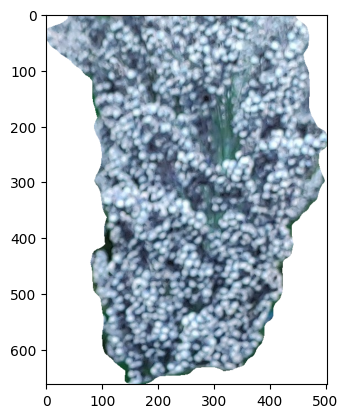

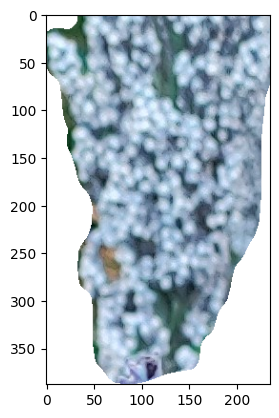

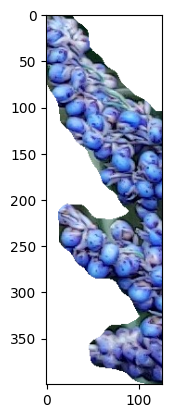

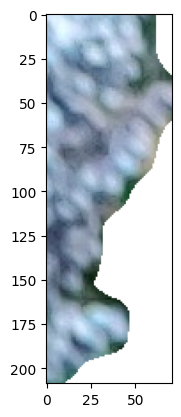

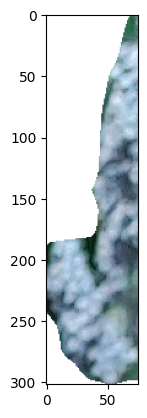

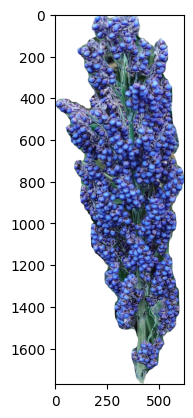

In [9]:
from ultralytics import YOLO
import numpy as np
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

model = YOLO('./runs/segment/train4/weights/best.pt')

results = model.predict(source = "./test_images/090528.jpg",
                        stream = True,
                        retina_masks = True,
                        conf = 0.5)

resultados_test = []
for result in results:
    img = np.copy(result.orig_img)
    img_name = Path(result.path).stem

    for ci,c in enumerate(result):
        label = c.names[c.boxes.cls.tolist().pop()]

        b_mask = np.zeros(img.shape[:2], np.uint8)

        # Create contour mask 
        contour = c.masks.xy.pop().astype(np.int32).reshape(-1, 1, 2)
        _ = cv2.drawContours(b_mask, [contour], -1, (255, 255, 255), cv2.FILLED)

        # OPTION-2: Isolate object with transparent background (when saved as PNG)
        isolated = np.dstack([img, b_mask])
        contour = contour.reshape(-1, 2)

        # Extract x_min, y_min, x_max, y_max
        x_min, y_min = np.min(contour, axis=0)
        x_max, y_max = np.max(contour, axis=0)

        cropped_image = isolated[y_min:y_max, x_min:x_max]
        resultados_test.append(cropped_image)

for resultado in resultados_test:
    plt.imshow(resultado)
    plt.show()

## Detectron2

### Libraries

In [1]:
import sys, os, distutils.core

In [ ]:
!python -m pip install pyyaml==5.1

!git clone https://github.com/facebookresearch/detectron2

In [ ]:
!python -m pip install -e detectron2

In [1]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Sun_Jul_28_19:07:16_PDT_2019
Cuda compilation tools, release 10.1, V10.1.243
torch:  2.1 ; cuda:  cu118


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

from roboflow import Roboflow

### Prepare Dataset

In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="DyGHe7jMVkAC44FauaDI")
project = rf.workspace("ksu-ciampitti-lab").project("sorghum-ijsc1")
dataset = project.version(2).download("coco-segmentation")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Sorghum-2 in coco-segmentation:: 100%|██████████| 4631/4631 [00:09<00:00, 470.82it/s]


In [3]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "Sorghum_Detectron_v1/train/_annotations.coco.json", "Sorghum_Detectron_v1/train")
register_coco_instances("my_dataset_val", {}, "Sorghum_Detectron_v1/valid/_annotations.coco.json", "Sorghum_Detectron_v1/valid")
register_coco_instances("my_dataset_test", {}, "Sorghum_Detectron_v1/test/_annotations.coco.json", "Sorghum_Detectron_v1/test")

WARNING [11/17 10:10:03 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/17 10:10:03 d2.data.datasets.coco]: Loaded 4500 images in COCO format from Sorghum_Detectron_v1/train/_annotations.coco.json


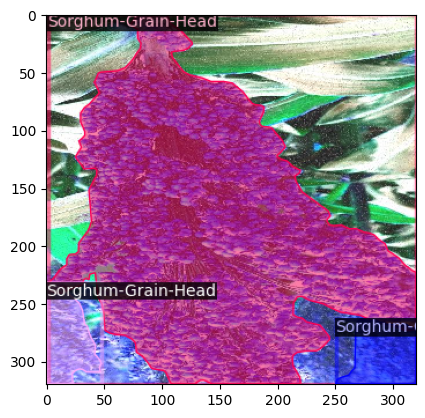

In [4]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer
import matplotlib.pyplot as plt

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.imshow(vis.get_image()[:, :, ::-1])

### Training

In [5]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [6]:
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001

cfg.SOLVER.MAX_ITER = 31500 #28 epochs with 4500 images and a batch of 4

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2

cfg.SOLVER.CHECKPOINT_PERIOD = 1000

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[11/06 11:20:59 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

WARNING [11/06 11:20:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/06 11:20:59 d2.data.datasets.coco]: Loaded 4500 images in COCO format from Sorghum_Detectron_v1/train/_annotations.coco.json
[11/06 11:20:59 d2.data.build]: Removed 0 images with no usable annotations. 4500 images left.
[11/06 11:20:59 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |   category    | #instances   |
|:----------:|:-------------|:-------------:|:-------------|
|  Sorghum   | 0            | Sorghum-Gra.. | 9862         |
|            |              |               |              |
|   total    | 9862         |               |              |
[11/06 11:20:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[11/06 11:20:59 d2.data.build]: Using t

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)


[11/06 11:21:14 d2.utils.events]:  eta: 3:39:03  iter: 10019  total_loss: 0.2704  loss_cls: 0.03096  loss_box_reg: 0.111  loss_mask: 0.1164  loss_rpn_cls: 0.0005255  loss_rpn_loc: 0.006882    time: 0.6052  last_time: 0.6571  data_time: 0.0117  last_data_time: 0.0087   lr: 0.001  max_mem: 4238M
[11/06 11:21:27 d2.utils.events]:  eta: 3:38:50  iter: 10039  total_loss: 0.3132  loss_cls: 0.03027  loss_box_reg: 0.1328  loss_mask: 0.1245  loss_rpn_cls: 0.0004689  loss_rpn_loc: 0.007    time: 0.6168  last_time: 0.5962  data_time: 0.0085  last_data_time: 0.0073   lr: 0.001  max_mem: 4239M
[11/06 11:21:39 d2.utils.events]:  eta: 3:41:28  iter: 10059  total_loss: 0.3263  loss_cls: 0.03922  loss_box_reg: 0.1465  loss_mask: 0.1352  loss_rpn_cls: 0.001665  loss_rpn_loc: 0.007532    time: 0.6212  last_time: 0.6356  data_time: 0.0081  last_data_time: 0.0071   lr: 0.001  max_mem: 4239M
[11/06 11:21:52 d2.utils.events]:  eta: 3:41:06  iter: 10079  total_loss: 0.3284  loss_cls: 0.03838  loss_box_reg: 0.

[11/06 11:26:37 d2.utils.events]:  eta: 3:32:06  iter: 10559  total_loss: 0.299  loss_cls: 0.03435  loss_box_reg: 0.1362  loss_mask: 0.1132  loss_rpn_cls: 0.0007032  loss_rpn_loc: 0.006452    time: 0.5960  last_time: 0.5439  data_time: 0.0083  last_data_time: 0.0086   lr: 0.001  max_mem: 4241M
[11/06 11:26:48 d2.utils.events]:  eta: 3:31:49  iter: 10579  total_loss: 0.2855  loss_cls: 0.02882  loss_box_reg: 0.1101  loss_mask: 0.1317  loss_rpn_cls: 0.001241  loss_rpn_loc: 0.007648    time: 0.5956  last_time: 0.6097  data_time: 0.0083  last_data_time: 0.0087   lr: 0.001  max_mem: 4241M
[11/06 11:27:00 d2.utils.events]:  eta: 3:31:32  iter: 10599  total_loss: 0.3125  loss_cls: 0.0451  loss_box_reg: 0.1397  loss_mask: 0.1308  loss_rpn_cls: 0.0006252  loss_rpn_loc: 0.006845    time: 0.5955  last_time: 0.5474  data_time: 0.0081  last_data_time: 0.0080   lr: 0.001  max_mem: 4241M
[11/06 11:27:12 d2.utils.events]:  eta: 3:31:10  iter: 10619  total_loss: 0.2868  loss_cls: 0.02339  loss_box_reg: 

[11/06 11:31:55 d2.utils.events]:  eta: 3:26:38  iter: 11099  total_loss: 0.3009  loss_cls: 0.03853  loss_box_reg: 0.1231  loss_mask: 0.13  loss_rpn_cls: 0.0005704  loss_rpn_loc: 0.007904    time: 0.5922  last_time: 0.5570  data_time: 0.0082  last_data_time: 0.0084   lr: 0.001  max_mem: 4241M
[11/06 11:32:07 d2.utils.events]:  eta: 3:26:37  iter: 11119  total_loss: 0.2726  loss_cls: 0.03883  loss_box_reg: 0.1084  loss_mask: 0.1134  loss_rpn_cls: 0.0009744  loss_rpn_loc: 0.007021    time: 0.5926  last_time: 0.5497  data_time: 0.0083  last_data_time: 0.0076   lr: 0.001  max_mem: 4241M
[11/06 11:32:19 d2.utils.events]:  eta: 3:26:35  iter: 11139  total_loss: 0.3076  loss_cls: 0.03367  loss_box_reg: 0.1331  loss_mask: 0.1137  loss_rpn_cls: 0.0007631  loss_rpn_loc: 0.007549    time: 0.5928  last_time: 0.6217  data_time: 0.0084  last_data_time: 0.0085   lr: 0.001  max_mem: 4241M
[11/06 11:32:31 d2.utils.events]:  eta: 3:26:17  iter: 11159  total_loss: 0.3366  loss_cls: 0.0412  loss_box_reg: 

[11/06 11:37:14 d2.utils.events]:  eta: 3:21:42  iter: 11639  total_loss: 0.3379  loss_cls: 0.04548  loss_box_reg: 0.1485  loss_mask: 0.1259  loss_rpn_cls: 0.001018  loss_rpn_loc: 0.007982    time: 0.5913  last_time: 0.6382  data_time: 0.0083  last_data_time: 0.0081   lr: 0.001  max_mem: 4241M
[11/06 11:37:26 d2.utils.events]:  eta: 3:21:36  iter: 11659  total_loss: 0.2869  loss_cls: 0.03709  loss_box_reg: 0.1293  loss_mask: 0.1219  loss_rpn_cls: 0.0006896  loss_rpn_loc: 0.007609    time: 0.5914  last_time: 0.5573  data_time: 0.0081  last_data_time: 0.0082   lr: 0.001  max_mem: 4241M
[11/06 11:37:38 d2.utils.events]:  eta: 3:21:09  iter: 11679  total_loss: 0.2912  loss_cls: 0.03675  loss_box_reg: 0.1087  loss_mask: 0.1269  loss_rpn_cls: 0.0006168  loss_rpn_loc: 0.006379    time: 0.5911  last_time: 0.5477  data_time: 0.0088  last_data_time: 0.0084   lr: 0.001  max_mem: 4241M
[11/06 11:37:49 d2.utils.events]:  eta: 3:20:53  iter: 11699  total_loss: 0.2997  loss_cls: 0.04532  loss_box_reg

[11/06 11:42:35 d2.utils.events]:  eta: 3:16:50  iter: 12179  total_loss: 0.2853  loss_cls: 0.02592  loss_box_reg: 0.1173  loss_mask: 0.1261  loss_rpn_cls: 0.0008256  loss_rpn_loc: 0.006524    time: 0.5918  last_time: 0.5622  data_time: 0.0081  last_data_time: 0.0089   lr: 0.001  max_mem: 4241M
[11/06 11:42:47 d2.utils.events]:  eta: 3:16:38  iter: 12199  total_loss: 0.3088  loss_cls: 0.03431  loss_box_reg: 0.1312  loss_mask: 0.1293  loss_rpn_cls: 0.0005583  loss_rpn_loc: 0.008174    time: 0.5918  last_time: 0.6095  data_time: 0.0082  last_data_time: 0.0087   lr: 0.001  max_mem: 4241M
[11/06 11:42:59 d2.utils.events]:  eta: 3:16:31  iter: 12219  total_loss: 0.2953  loss_cls: 0.02586  loss_box_reg: 0.1179  loss_mask: 0.1271  loss_rpn_cls: 0.0006141  loss_rpn_loc: 0.008059    time: 0.5919  last_time: 0.6226  data_time: 0.0082  last_data_time: 0.0086   lr: 0.001  max_mem: 4241M
[11/06 11:43:11 d2.utils.events]:  eta: 3:16:23  iter: 12239  total_loss: 0.3077  loss_cls: 0.02925  loss_box_re

[11/06 11:47:55 d2.utils.events]:  eta: 3:12:00  iter: 12719  total_loss: 0.2837  loss_cls: 0.03525  loss_box_reg: 0.1172  loss_mask: 0.1195  loss_rpn_cls: 0.0005635  loss_rpn_loc: 0.006389    time: 0.5917  last_time: 0.4765  data_time: 0.0083  last_data_time: 0.0085   lr: 0.001  max_mem: 4241M
[11/06 11:48:07 d2.utils.events]:  eta: 3:11:41  iter: 12739  total_loss: 0.302  loss_cls: 0.03638  loss_box_reg: 0.1355  loss_mask: 0.1307  loss_rpn_cls: 0.0008306  loss_rpn_loc: 0.006056    time: 0.5916  last_time: 0.5912  data_time: 0.0080  last_data_time: 0.0081   lr: 0.001  max_mem: 4241M
[11/06 11:48:19 d2.utils.events]:  eta: 3:11:26  iter: 12759  total_loss: 0.3386  loss_cls: 0.04286  loss_box_reg: 0.1463  loss_mask: 0.1284  loss_rpn_cls: 0.001035  loss_rpn_loc: 0.009388    time: 0.5915  last_time: 0.5954  data_time: 0.0083  last_data_time: 0.0088   lr: 0.001  max_mem: 4241M
[11/06 11:48:30 d2.utils.events]:  eta: 3:10:51  iter: 12779  total_loss: 0.3061  loss_cls: 0.02976  loss_box_reg:

[11/06 11:53:07 d2.utils.events]:  eta: 3:00:22  iter: 13259  total_loss: 0.2689  loss_cls: 0.0244  loss_box_reg: 0.1173  loss_mask: 0.1168  loss_rpn_cls: 0.0009136  loss_rpn_loc: 0.007513    time: 0.5891  last_time: 0.5398  data_time: 0.0077  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 11:53:18 d2.utils.events]:  eta: 3:00:05  iter: 13279  total_loss: 0.302  loss_cls: 0.03261  loss_box_reg: 0.1386  loss_mask: 0.1233  loss_rpn_cls: 0.0007111  loss_rpn_loc: 0.009236    time: 0.5889  last_time: 0.5071  data_time: 0.0089  last_data_time: 0.0091   lr: 0.001  max_mem: 4241M
[11/06 11:53:30 d2.utils.events]:  eta: 2:59:50  iter: 13299  total_loss: 0.2709  loss_cls: 0.03107  loss_box_reg: 0.1277  loss_mask: 0.1165  loss_rpn_cls: 0.0005982  loss_rpn_loc: 0.007102    time: 0.5888  last_time: 0.5495  data_time: 0.0092  last_data_time: 0.0092   lr: 0.001  max_mem: 4241M
[11/06 11:53:41 d2.utils.events]:  eta: 2:59:34  iter: 13319  total_loss: 0.2838  loss_cls: 0.03048  loss_box_reg:

[11/06 11:58:14 d2.utils.events]:  eta: 2:54:05  iter: 13799  total_loss: 0.2624  loss_cls: 0.03013  loss_box_reg: 0.1087  loss_mask: 0.1139  loss_rpn_cls: 0.0004652  loss_rpn_loc: 0.007032    time: 0.5860  last_time: 0.5304  data_time: 0.0085  last_data_time: 0.0076   lr: 0.001  max_mem: 4241M
[11/06 11:58:26 d2.utils.events]:  eta: 2:53:53  iter: 13819  total_loss: 0.2831  loss_cls: 0.03099  loss_box_reg: 0.1339  loss_mask: 0.1223  loss_rpn_cls: 0.0007024  loss_rpn_loc: 0.008128    time: 0.5860  last_time: 0.6022  data_time: 0.0084  last_data_time: 0.0087   lr: 0.001  max_mem: 4241M
[11/06 11:58:38 d2.utils.events]:  eta: 2:53:40  iter: 13839  total_loss: 0.277  loss_cls: 0.02711  loss_box_reg: 0.1228  loss_mask: 0.1169  loss_rpn_cls: 0.0007097  loss_rpn_loc: 0.00655    time: 0.5859  last_time: 0.6512  data_time: 0.0082  last_data_time: 0.0082   lr: 0.001  max_mem: 4241M
[11/06 11:58:49 d2.utils.events]:  eta: 2:53:28  iter: 13859  total_loss: 0.2532  loss_cls: 0.02492  loss_box_reg:

[11/06 12:03:20 d2.utils.events]:  eta: 2:46:42  iter: 14339  total_loss: 0.2612  loss_cls: 0.02604  loss_box_reg: 0.1118  loss_mask: 0.105  loss_rpn_cls: 0.0009726  loss_rpn_loc: 0.006877    time: 0.5834  last_time: 0.5834  data_time: 0.0080  last_data_time: 0.0081   lr: 0.001  max_mem: 4241M
[11/06 12:03:31 d2.utils.events]:  eta: 2:46:32  iter: 14359  total_loss: 0.2515  loss_cls: 0.02362  loss_box_reg: 0.1065  loss_mask: 0.1018  loss_rpn_cls: 0.0006269  loss_rpn_loc: 0.007069    time: 0.5833  last_time: 0.5466  data_time: 0.0079  last_data_time: 0.0073   lr: 0.001  max_mem: 4241M
[11/06 12:03:42 d2.utils.events]:  eta: 2:46:14  iter: 14379  total_loss: 0.2481  loss_cls: 0.02479  loss_box_reg: 0.1092  loss_mask: 0.1063  loss_rpn_cls: 0.0006262  loss_rpn_loc: 0.006801    time: 0.5831  last_time: 0.5795  data_time: 0.0082  last_data_time: 0.0090   lr: 0.001  max_mem: 4241M
[11/06 12:03:53 d2.utils.events]:  eta: 2:46:01  iter: 14399  total_loss: 0.2521  loss_cls: 0.02881  loss_box_reg

[11/06 12:08:23 d2.utils.events]:  eta: 2:41:01  iter: 14879  total_loss: 0.2532  loss_cls: 0.02952  loss_box_reg: 0.1089  loss_mask: 0.1194  loss_rpn_cls: 0.0009474  loss_rpn_loc: 0.007554    time: 0.5807  last_time: 0.5235  data_time: 0.0084  last_data_time: 0.0084   lr: 0.001  max_mem: 4241M
[11/06 12:08:34 d2.utils.events]:  eta: 2:40:51  iter: 14899  total_loss: 0.3045  loss_cls: 0.03227  loss_box_reg: 0.1192  loss_mask: 0.1307  loss_rpn_cls: 0.0007777  loss_rpn_loc: 0.008165    time: 0.5807  last_time: 0.5185  data_time: 0.0083  last_data_time: 0.0085   lr: 0.001  max_mem: 4241M
[11/06 12:08:46 d2.utils.events]:  eta: 2:40:39  iter: 14919  total_loss: 0.262  loss_cls: 0.02826  loss_box_reg: 0.1127  loss_mask: 0.1132  loss_rpn_cls: 0.000753  loss_rpn_loc: 0.005557    time: 0.5806  last_time: 0.5797  data_time: 0.0079  last_data_time: 0.0079   lr: 0.001  max_mem: 4241M
[11/06 12:08:56 d2.utils.events]:  eta: 2:40:27  iter: 14939  total_loss: 0.2575  loss_cls: 0.02441  loss_box_reg:

[11/06 12:13:23 d2.utils.events]:  eta: 2:35:24  iter: 15419  total_loss: 0.2647  loss_cls: 0.02756  loss_box_reg: 0.1159  loss_mask: 0.1108  loss_rpn_cls: 0.0005802  loss_rpn_loc: 0.00634    time: 0.5779  last_time: 0.5194  data_time: 0.0078  last_data_time: 0.0074   lr: 0.001  max_mem: 4241M
[11/06 12:13:34 d2.utils.events]:  eta: 2:35:12  iter: 15439  total_loss: 0.303  loss_cls: 0.03016  loss_box_reg: 0.1358  loss_mask: 0.1195  loss_rpn_cls: 0.0006603  loss_rpn_loc: 0.007333    time: 0.5778  last_time: 0.5864  data_time: 0.0081  last_data_time: 0.0083   lr: 0.001  max_mem: 4241M
[11/06 12:13:45 d2.utils.events]:  eta: 2:34:57  iter: 15459  total_loss: 0.2408  loss_cls: 0.02134  loss_box_reg: 0.0945  loss_mask: 0.1056  loss_rpn_cls: 0.0006261  loss_rpn_loc: 0.006374    time: 0.5778  last_time: 0.5823  data_time: 0.0081  last_data_time: 0.0083   lr: 0.001  max_mem: 4241M
[11/06 12:13:56 d2.utils.events]:  eta: 2:34:47  iter: 15479  total_loss: 0.2657  loss_cls: 0.02856  loss_box_reg:

[11/06 12:18:23 d2.utils.events]:  eta: 2:30:00  iter: 15959  total_loss: 0.2275  loss_cls: 0.0242  loss_box_reg: 0.09247  loss_mask: 0.1147  loss_rpn_cls: 0.000417  loss_rpn_loc: 0.006591    time: 0.5759  last_time: 0.6639  data_time: 0.0080  last_data_time: 0.0082   lr: 0.001  max_mem: 4241M
[11/06 12:18:35 d2.utils.events]:  eta: 2:29:48  iter: 15979  total_loss: 0.2563  loss_cls: 0.02799  loss_box_reg: 0.1057  loss_mask: 0.1164  loss_rpn_cls: 0.0004763  loss_rpn_loc: 0.00742    time: 0.5758  last_time: 0.4997  data_time: 0.0079  last_data_time: 0.0075   lr: 0.001  max_mem: 4241M
[11/06 12:18:46 d2.utils.events]:  eta: 2:29:38  iter: 15999  total_loss: 0.2496  loss_cls: 0.02092  loss_box_reg: 0.1024  loss_mask: 0.1099  loss_rpn_cls: 0.0004243  loss_rpn_loc: 0.00711    time: 0.5758  last_time: 0.6009  data_time: 0.0079  last_data_time: 0.0076   lr: 0.001  max_mem: 4241M
[11/06 12:18:57 d2.utils.events]:  eta: 2:29:27  iter: 16019  total_loss: 0.2535  loss_cls: 0.01835  loss_box_reg: 

[11/06 12:23:25 d2.utils.events]:  eta: 2:25:04  iter: 16499  total_loss: 0.2318  loss_cls: 0.02565  loss_box_reg: 0.09366  loss_mask: 0.09917  loss_rpn_cls: 0.0008282  loss_rpn_loc: 0.006082    time: 0.5743  last_time: 0.5213  data_time: 0.0080  last_data_time: 0.0084   lr: 0.001  max_mem: 4241M
[11/06 12:23:36 d2.utils.events]:  eta: 2:24:52  iter: 16519  total_loss: 0.2199  loss_cls: 0.01843  loss_box_reg: 0.09108  loss_mask: 0.1015  loss_rpn_cls: 0.0003693  loss_rpn_loc: 0.005762    time: 0.5742  last_time: 0.6614  data_time: 0.0079  last_data_time: 0.0076   lr: 0.001  max_mem: 4241M
[11/06 12:23:47 d2.utils.events]:  eta: 2:24:41  iter: 16539  total_loss: 0.2401  loss_cls: 0.02044  loss_box_reg: 0.1018  loss_mask: 0.1123  loss_rpn_cls: 0.0005165  loss_rpn_loc: 0.007264    time: 0.5742  last_time: 0.5841  data_time: 0.0079  last_data_time: 0.0084   lr: 0.001  max_mem: 4241M
[11/06 12:23:58 d2.utils.events]:  eta: 2:24:26  iter: 16559  total_loss: 0.2597  loss_cls: 0.02413  loss_box

[11/06 12:28:24 d2.utils.events]:  eta: 2:19:30  iter: 17039  total_loss: 0.2659  loss_cls: 0.02589  loss_box_reg: 0.1063  loss_mask: 0.1122  loss_rpn_cls: 0.0005889  loss_rpn_loc: 0.007569    time: 0.5726  last_time: 0.6664  data_time: 0.0079  last_data_time: 0.0079   lr: 0.001  max_mem: 4241M
[11/06 12:28:35 d2.utils.events]:  eta: 2:19:23  iter: 17059  total_loss: 0.2866  loss_cls: 0.02945  loss_box_reg: 0.1204  loss_mask: 0.1225  loss_rpn_cls: 0.0005517  loss_rpn_loc: 0.00818    time: 0.5726  last_time: 0.5821  data_time: 0.0078  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 12:28:46 d2.utils.events]:  eta: 2:19:04  iter: 17079  total_loss: 0.2483  loss_cls: 0.02557  loss_box_reg: 0.1098  loss_mask: 0.1069  loss_rpn_cls: 0.0005194  loss_rpn_loc: 0.00644    time: 0.5725  last_time: 0.5767  data_time: 0.0076  last_data_time: 0.0069   lr: 0.001  max_mem: 4241M
[11/06 12:28:57 d2.utils.events]:  eta: 2:18:53  iter: 17099  total_loss: 0.2365  loss_cls: 0.01899  loss_box_reg:

[11/06 12:33:24 d2.utils.events]:  eta: 2:14:10  iter: 17579  total_loss: 0.2424  loss_cls: 0.02552  loss_box_reg: 0.0922  loss_mask: 0.1108  loss_rpn_cls: 0.0004391  loss_rpn_loc: 0.006509    time: 0.5713  last_time: 0.6667  data_time: 0.0076  last_data_time: 0.0076   lr: 0.001  max_mem: 4241M
[11/06 12:33:35 d2.utils.events]:  eta: 2:14:02  iter: 17599  total_loss: 0.2593  loss_cls: 0.0273  loss_box_reg: 0.1133  loss_mask: 0.1167  loss_rpn_cls: 0.0007594  loss_rpn_loc: 0.007205    time: 0.5712  last_time: 0.5823  data_time: 0.0075  last_data_time: 0.0073   lr: 0.001  max_mem: 4241M
[11/06 12:33:46 d2.utils.events]:  eta: 2:13:52  iter: 17619  total_loss: 0.2431  loss_cls: 0.02866  loss_box_reg: 0.09765  loss_mask: 0.1087  loss_rpn_cls: 0.0005431  loss_rpn_loc: 0.007009    time: 0.5712  last_time: 0.5807  data_time: 0.0076  last_data_time: 0.0070   lr: 0.001  max_mem: 4241M
[11/06 12:33:57 d2.utils.events]:  eta: 2:13:40  iter: 17639  total_loss: 0.2307  loss_cls: 0.02471  loss_box_re

[11/06 12:38:25 d2.utils.events]:  eta: 2:09:14  iter: 18119  total_loss: 0.2269  loss_cls: 0.02455  loss_box_reg: 0.08701  loss_mask: 0.1013  loss_rpn_cls: 0.0008313  loss_rpn_loc: 0.00612    time: 0.5702  last_time: 0.5268  data_time: 0.0077  last_data_time: 0.0079   lr: 0.001  max_mem: 4241M
[11/06 12:38:36 d2.utils.events]:  eta: 2:08:59  iter: 18139  total_loss: 0.2332  loss_cls: 0.02063  loss_box_reg: 0.09473  loss_mask: 0.105  loss_rpn_cls: 0.0005027  loss_rpn_loc: 0.0066    time: 0.5702  last_time: 0.5816  data_time: 0.0079  last_data_time: 0.0079   lr: 0.001  max_mem: 4241M
[11/06 12:38:46 d2.utils.events]:  eta: 2:08:47  iter: 18159  total_loss: 0.212  loss_cls: 0.01969  loss_box_reg: 0.08253  loss_mask: 0.1006  loss_rpn_cls: 0.0003095  loss_rpn_loc: 0.006058    time: 0.5701  last_time: 0.5235  data_time: 0.0079  last_data_time: 0.0079   lr: 0.001  max_mem: 4241M
[11/06 12:38:57 d2.utils.events]:  eta: 2:08:33  iter: 18179  total_loss: 0.2502  loss_cls: 0.022  loss_box_reg: 0

[11/06 12:43:22 d2.utils.events]:  eta: 2:03:48  iter: 18659  total_loss: 0.2354  loss_cls: 0.01824  loss_box_reg: 0.09975  loss_mask: 0.107  loss_rpn_cls: 0.0003295  loss_rpn_loc: 0.006269    time: 0.5690  last_time: 0.4654  data_time: 0.0076  last_data_time: 0.0079   lr: 0.001  max_mem: 4241M
[11/06 12:43:33 d2.utils.events]:  eta: 2:03:37  iter: 18679  total_loss: 0.2535  loss_cls: 0.01808  loss_box_reg: 0.1033  loss_mask: 0.1115  loss_rpn_cls: 0.000487  loss_rpn_loc: 0.006815    time: 0.5689  last_time: 0.5823  data_time: 0.0077  last_data_time: 0.0073   lr: 0.001  max_mem: 4241M
[11/06 12:43:44 d2.utils.events]:  eta: 2:03:26  iter: 18699  total_loss: 0.2544  loss_cls: 0.02032  loss_box_reg: 0.09977  loss_mask: 0.1162  loss_rpn_cls: 0.0006469  loss_rpn_loc: 0.006168    time: 0.5689  last_time: 0.5231  data_time: 0.0076  last_data_time: 0.0081   lr: 0.001  max_mem: 4241M
[11/06 12:43:56 d2.utils.events]:  eta: 2:03:22  iter: 18719  total_loss: 0.256  loss_cls: 0.02489  loss_box_reg

[11/06 12:48:23 d2.utils.events]:  eta: 1:58:41  iter: 19199  total_loss: 0.2122  loss_cls: 0.01777  loss_box_reg: 0.08792  loss_mask: 0.1046  loss_rpn_cls: 0.0004003  loss_rpn_loc: 0.005964    time: 0.5682  last_time: 0.4979  data_time: 0.0074  last_data_time: 0.0071   lr: 0.001  max_mem: 4241M
[11/06 12:48:34 d2.utils.events]:  eta: 1:58:29  iter: 19219  total_loss: 0.2064  loss_cls: 0.02014  loss_box_reg: 0.08378  loss_mask: 0.099  loss_rpn_cls: 0.0005272  loss_rpn_loc: 0.006313    time: 0.5682  last_time: 0.6606  data_time: 0.0075  last_data_time: 0.0079   lr: 0.001  max_mem: 4241M
[11/06 12:48:45 d2.utils.events]:  eta: 1:58:19  iter: 19239  total_loss: 0.2268  loss_cls: 0.01709  loss_box_reg: 0.08825  loss_mask: 0.1014  loss_rpn_cls: 0.0002923  loss_rpn_loc: 0.005735    time: 0.5681  last_time: 0.4985  data_time: 0.0075  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 12:48:56 d2.utils.events]:  eta: 1:58:08  iter: 19259  total_loss: 0.2557  loss_cls: 0.02304  loss_box_

[11/06 12:53:24 d2.utils.events]:  eta: 1:53:36  iter: 19739  total_loss: 0.2663  loss_cls: 0.02671  loss_box_reg: 0.1037  loss_mask: 0.1125  loss_rpn_cls: 0.0005409  loss_rpn_loc: 0.006808    time: 0.5675  last_time: 0.6641  data_time: 0.0077  last_data_time: 0.0080   lr: 0.001  max_mem: 4241M
[11/06 12:53:35 d2.utils.events]:  eta: 1:53:24  iter: 19759  total_loss: 0.22  loss_cls: 0.02126  loss_box_reg: 0.09088  loss_mask: 0.1029  loss_rpn_cls: 0.0006368  loss_rpn_loc: 0.006914    time: 0.5674  last_time: 0.5221  data_time: 0.0075  last_data_time: 0.0072   lr: 0.001  max_mem: 4241M
[11/06 12:53:46 d2.utils.events]:  eta: 1:53:12  iter: 19779  total_loss: 0.2307  loss_cls: 0.0225  loss_box_reg: 0.09343  loss_mask: 0.1047  loss_rpn_cls: 0.0008173  loss_rpn_loc: 0.008039    time: 0.5675  last_time: 0.5784  data_time: 0.0077  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 12:53:57 d2.utils.events]:  eta: 1:53:01  iter: 19799  total_loss: 0.2409  loss_cls: 0.01889  loss_box_reg

[11/06 12:58:25 d2.utils.events]:  eta: 1:48:18  iter: 20279  total_loss: 0.2422  loss_cls: 0.02023  loss_box_reg: 0.1019  loss_mask: 0.1032  loss_rpn_cls: 0.0003025  loss_rpn_loc: 0.006381    time: 0.5668  last_time: 0.4970  data_time: 0.0074  last_data_time: 0.0071   lr: 0.001  max_mem: 4241M
[11/06 12:58:36 d2.utils.events]:  eta: 1:48:07  iter: 20299  total_loss: 0.2272  loss_cls: 0.02126  loss_box_reg: 0.09373  loss_mask: 0.09864  loss_rpn_cls: 0.0003738  loss_rpn_loc: 0.005654    time: 0.5668  last_time: 0.5844  data_time: 0.0073  last_data_time: 0.0071   lr: 0.001  max_mem: 4241M
[11/06 12:58:47 d2.utils.events]:  eta: 1:47:55  iter: 20319  total_loss: 0.2376  loss_cls: 0.02106  loss_box_reg: 0.09862  loss_mask: 0.1056  loss_rpn_cls: 0.0003919  loss_rpn_loc: 0.005519    time: 0.5667  last_time: 0.5816  data_time: 0.0075  last_data_time: 0.0076   lr: 0.001  max_mem: 4241M
[11/06 12:58:58 d2.utils.events]:  eta: 1:47:46  iter: 20339  total_loss: 0.2281  loss_cls: 0.02004  loss_box

[11/06 13:03:25 d2.utils.events]:  eta: 1:43:05  iter: 20819  total_loss: 0.2435  loss_cls: 0.01986  loss_box_reg: 0.0906  loss_mask: 0.1143  loss_rpn_cls: 0.0005832  loss_rpn_loc: 0.005339    time: 0.5662  last_time: 0.5844  data_time: 0.0077  last_data_time: 0.0081   lr: 0.001  max_mem: 4241M
[11/06 13:03:36 d2.utils.events]:  eta: 1:42:56  iter: 20839  total_loss: 0.2042  loss_cls: 0.01923  loss_box_reg: 0.07311  loss_mask: 0.09416  loss_rpn_cls: 0.0006085  loss_rpn_loc: 0.00547    time: 0.5662  last_time: 0.4939  data_time: 0.0080  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 13:03:47 d2.utils.events]:  eta: 1:42:45  iter: 20859  total_loss: 0.2612  loss_cls: 0.02225  loss_box_reg: 0.106  loss_mask: 0.117  loss_rpn_cls: 0.0005678  loss_rpn_loc: 0.007054    time: 0.5662  last_time: 0.6326  data_time: 0.0080  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 13:03:58 d2.utils.events]:  eta: 1:42:30  iter: 20879  total_loss: 0.2111  loss_cls: 0.01751  loss_box_reg

[11/06 13:08:24 d2.utils.events]:  eta: 1:37:53  iter: 21359  total_loss: 0.2183  loss_cls: 0.01755  loss_box_reg: 0.09259  loss_mask: 0.1003  loss_rpn_cls: 0.0002585  loss_rpn_loc: 0.005572    time: 0.5656  last_time: 0.5829  data_time: 0.0082  last_data_time: 0.0080   lr: 0.001  max_mem: 4241M
[11/06 13:08:36 d2.utils.events]:  eta: 1:37:44  iter: 21379  total_loss: 0.2114  loss_cls: 0.02217  loss_box_reg: 0.09257  loss_mask: 0.09498  loss_rpn_cls: 0.0003957  loss_rpn_loc: 0.006056    time: 0.5656  last_time: 0.5210  data_time: 0.0081  last_data_time: 0.0081   lr: 0.001  max_mem: 4241M
[11/06 13:08:47 d2.utils.events]:  eta: 1:37:31  iter: 21399  total_loss: 0.2175  loss_cls: 0.01883  loss_box_reg: 0.09427  loss_mask: 0.1002  loss_rpn_cls: 0.0002884  loss_rpn_loc: 0.004582    time: 0.5655  last_time: 0.5270  data_time: 0.0080  last_data_time: 0.0078   lr: 0.001  max_mem: 4241M
[11/06 13:08:58 d2.utils.events]:  eta: 1:37:20  iter: 21419  total_loss: 0.2237  loss_cls: 0.01768  loss_bo

[11/06 13:13:26 d2.utils.events]:  eta: 1:32:41  iter: 21899  total_loss: 0.2395  loss_cls: 0.0249  loss_box_reg: 0.1005  loss_mask: 0.1028  loss_rpn_cls: 0.0004091  loss_rpn_loc: 0.006202    time: 0.5652  last_time: 0.5799  data_time: 0.0081  last_data_time: 0.0078   lr: 0.001  max_mem: 4241M
[11/06 13:13:37 d2.utils.events]:  eta: 1:32:30  iter: 21919  total_loss: 0.2022  loss_cls: 0.01622  loss_box_reg: 0.07932  loss_mask: 0.0929  loss_rpn_cls: 0.0006676  loss_rpn_loc: 0.006605    time: 0.5652  last_time: 0.5788  data_time: 0.0082  last_data_time: 0.0083   lr: 0.001  max_mem: 4241M
[11/06 13:13:48 d2.utils.events]:  eta: 1:32:17  iter: 21939  total_loss: 0.2332  loss_cls: 0.01946  loss_box_reg: 0.09398  loss_mask: 0.1115  loss_rpn_cls: 0.0005306  loss_rpn_loc: 0.005686    time: 0.5651  last_time: 0.5260  data_time: 0.0083  last_data_time: 0.0086   lr: 0.001  max_mem: 4241M
[11/06 13:13:59 d2.utils.events]:  eta: 1:32:07  iter: 21959  total_loss: 0.2207  loss_cls: 0.02301  loss_box_r

[11/06 13:18:25 d2.utils.events]:  eta: 1:27:31  iter: 22439  total_loss: 0.2183  loss_cls: 0.01734  loss_box_reg: 0.09239  loss_mask: 0.1024  loss_rpn_cls: 0.0003392  loss_rpn_loc: 0.005989    time: 0.5647  last_time: 0.6410  data_time: 0.0082  last_data_time: 0.0080   lr: 0.001  max_mem: 4241M
[11/06 13:18:36 d2.utils.events]:  eta: 1:27:20  iter: 22459  total_loss: 0.1978  loss_cls: 0.01562  loss_box_reg: 0.07994  loss_mask: 0.08876  loss_rpn_cls: 0.0003807  loss_rpn_loc: 0.005316    time: 0.5646  last_time: 0.5834  data_time: 0.0076  last_data_time: 0.0075   lr: 0.001  max_mem: 4241M
[11/06 13:18:47 d2.utils.events]:  eta: 1:27:08  iter: 22479  total_loss: 0.211  loss_cls: 0.01711  loss_box_reg: 0.08375  loss_mask: 0.1006  loss_rpn_cls: 0.0003028  loss_rpn_loc: 0.005288    time: 0.5646  last_time: 0.5627  data_time: 0.0078  last_data_time: 0.0076   lr: 0.001  max_mem: 4241M
[11/06 13:18:59 d2.utils.events]:  eta: 1:26:57  iter: 22499  total_loss: 0.2184  loss_cls: 0.01593  loss_box

[11/06 13:23:28 d2.utils.events]:  eta: 1:22:29  iter: 22979  total_loss: 0.1911  loss_cls: 0.01675  loss_box_reg: 0.07482  loss_mask: 0.08925  loss_rpn_cls: 0.0003128  loss_rpn_loc: 0.00546    time: 0.5644  last_time: 0.5901  data_time: 0.0085  last_data_time: 0.0094   lr: 0.001  max_mem: 4241M
[11/06 13:23:39 d2.utils.events]:  eta: 1:22:17  iter: 22999  total_loss: 0.2213  loss_cls: 0.02184  loss_box_reg: 0.08986  loss_mask: 0.09762  loss_rpn_cls: 0.000581  loss_rpn_loc: 0.006474    time: 0.5644  last_time: 0.5860  data_time: 0.0083  last_data_time: 0.0085   lr: 0.001  max_mem: 4241M
[11/06 13:23:51 d2.utils.events]:  eta: 1:22:05  iter: 23019  total_loss: 0.214  loss_cls: 0.0213  loss_box_reg: 0.08173  loss_mask: 0.09987  loss_rpn_cls: 0.0003811  loss_rpn_loc: 0.005759    time: 0.5644  last_time: 0.5911  data_time: 0.0085  last_data_time: 0.0085   lr: 0.001  max_mem: 4241M
[11/06 13:24:02 d2.utils.events]:  eta: 1:21:54  iter: 23039  total_loss: 0.2153  loss_cls: 0.01952  loss_box_

[11/06 13:28:37 d2.utils.events]:  eta: 1:17:24  iter: 23519  total_loss: 0.2048  loss_cls: 0.01251  loss_box_reg: 0.08065  loss_mask: 0.101  loss_rpn_cls: 0.0001938  loss_rpn_loc: 0.005295    time: 0.5647  last_time: 0.5389  data_time: 0.0085  last_data_time: 0.0088   lr: 0.001  max_mem: 4241M
[11/06 13:28:48 d2.utils.events]:  eta: 1:17:13  iter: 23539  total_loss: 0.209  loss_cls: 0.0198  loss_box_reg: 0.07803  loss_mask: 0.1023  loss_rpn_cls: 0.0003438  loss_rpn_loc: 0.005326    time: 0.5647  last_time: 0.5516  data_time: 0.0084  last_data_time: 0.0092   lr: 0.001  max_mem: 4241M
[11/06 13:29:00 d2.utils.events]:  eta: 1:17:03  iter: 23559  total_loss: 0.2011  loss_cls: 0.01383  loss_box_reg: 0.08182  loss_mask: 0.09421  loss_rpn_cls: 0.0003544  loss_rpn_loc: 0.006115    time: 0.5647  last_time: 0.6027  data_time: 0.0082  last_data_time: 0.0083   lr: 0.001  max_mem: 4241M
[11/06 13:29:11 d2.utils.events]:  eta: 1:16:51  iter: 23579  total_loss: 0.2159  loss_cls: 0.01927  loss_box_r

[11/06 13:33:39 d2.utils.events]:  eta: 1:12:15  iter: 24059  total_loss: 0.2001  loss_cls: 0.01826  loss_box_reg: 0.08362  loss_mask: 0.09008  loss_rpn_cls: 0.000318  loss_rpn_loc: 0.005534    time: 0.5645  last_time: 0.5815  data_time: 0.0081  last_data_time: 0.0080   lr: 0.001  max_mem: 4241M
[11/06 13:33:50 d2.utils.events]:  eta: 1:12:01  iter: 24079  total_loss: 0.1919  loss_cls: 0.0119  loss_box_reg: 0.07171  loss_mask: 0.09594  loss_rpn_cls: 0.0002851  loss_rpn_loc: 0.005564    time: 0.5644  last_time: 0.6261  data_time: 0.0082  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 13:34:01 d2.utils.events]:  eta: 1:11:49  iter: 24099  total_loss: 0.1819  loss_cls: 0.01346  loss_box_reg: 0.07163  loss_mask: 0.09034  loss_rpn_cls: 0.0002702  loss_rpn_loc: 0.005418    time: 0.5644  last_time: 0.5242  data_time: 0.0086  last_data_time: 0.0083   lr: 0.001  max_mem: 4241M
[11/06 13:34:12 d2.utils.events]:  eta: 1:11:37  iter: 24119  total_loss: 0.2125  loss_cls: 0.02002  loss_bo

[11/06 13:38:39 d2.utils.events]:  eta: 1:06:51  iter: 24599  total_loss: 0.2004  loss_cls: 0.01455  loss_box_reg: 0.08298  loss_mask: 0.09372  loss_rpn_cls: 0.0003587  loss_rpn_loc: 0.005468    time: 0.5641  last_time: 0.5822  data_time: 0.0085  last_data_time: 0.0084   lr: 0.001  max_mem: 4241M
[11/06 13:38:50 d2.utils.events]:  eta: 1:06:39  iter: 24619  total_loss: 0.2233  loss_cls: 0.01954  loss_box_reg: 0.09722  loss_mask: 0.1046  loss_rpn_cls: 0.0003494  loss_rpn_loc: 0.005713    time: 0.5640  last_time: 0.5238  data_time: 0.0083  last_data_time: 0.0085   lr: 0.001  max_mem: 4241M
[11/06 13:39:01 d2.utils.events]:  eta: 1:06:28  iter: 24639  total_loss: 0.1815  loss_cls: 0.01252  loss_box_reg: 0.07019  loss_mask: 0.09347  loss_rpn_cls: 0.0004889  loss_rpn_loc: 0.005829    time: 0.5640  last_time: 0.5821  data_time: 0.0084  last_data_time: 0.0083   lr: 0.001  max_mem: 4241M
[11/06 13:39:13 d2.utils.events]:  eta: 1:06:16  iter: 24659  total_loss: 0.1915  loss_cls: 0.0185  loss_bo

[11/06 13:43:39 d2.utils.events]:  eta: 1:01:25  iter: 25139  total_loss: 0.2084  loss_cls: 0.0181  loss_box_reg: 0.08949  loss_mask: 0.09414  loss_rpn_cls: 0.0005525  loss_rpn_loc: 0.005991    time: 0.5637  last_time: 0.5241  data_time: 0.0082  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 13:43:50 d2.utils.events]:  eta: 1:01:13  iter: 25159  total_loss: 0.2055  loss_cls: 0.01748  loss_box_reg: 0.07952  loss_mask: 0.09062  loss_rpn_cls: 0.0003718  loss_rpn_loc: 0.005201    time: 0.5636  last_time: 0.5823  data_time: 0.0078  last_data_time: 0.0075   lr: 0.001  max_mem: 4241M
[11/06 13:44:01 d2.utils.events]:  eta: 1:01:00  iter: 25179  total_loss: 0.1904  loss_cls: 0.01293  loss_box_reg: 0.0794  loss_mask: 0.08913  loss_rpn_cls: 0.0002545  loss_rpn_loc: 0.004853    time: 0.5636  last_time: 0.5267  data_time: 0.0080  last_data_time: 0.0080   lr: 0.001  max_mem: 4241M
[11/06 13:44:13 d2.utils.events]:  eta: 1:00:50  iter: 25199  total_loss: 0.1894  loss_cls: 0.01757  loss_bo

[11/06 13:48:40 d2.utils.events]:  eta: 0:56:14  iter: 25679  total_loss: 0.2097  loss_cls: 0.01553  loss_box_reg: 0.08995  loss_mask: 0.09512  loss_rpn_cls: 0.000425  loss_rpn_loc: 0.005996    time: 0.5634  last_time: 0.4659  data_time: 0.0079  last_data_time: 0.0078   lr: 0.001  max_mem: 4241M
[11/06 13:48:51 d2.utils.events]:  eta: 0:56:04  iter: 25699  total_loss: 0.1872  loss_cls: 0.01166  loss_box_reg: 0.07517  loss_mask: 0.08993  loss_rpn_cls: 0.0002741  loss_rpn_loc: 0.006686    time: 0.5634  last_time: 0.5255  data_time: 0.0079  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 13:49:02 d2.utils.events]:  eta: 0:55:52  iter: 25719  total_loss: 0.1963  loss_cls: 0.01885  loss_box_reg: 0.07604  loss_mask: 0.09124  loss_rpn_cls: 0.0003146  loss_rpn_loc: 0.005212    time: 0.5633  last_time: 0.4651  data_time: 0.0080  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 13:49:13 d2.utils.events]:  eta: 0:55:39  iter: 25739  total_loss: 0.1937  loss_cls: 0.01332  loss_b

[11/06 13:53:37 d2.utils.events]:  eta: 0:50:56  iter: 26219  total_loss: 0.1977  loss_cls: 0.01649  loss_box_reg: 0.077  loss_mask: 0.09366  loss_rpn_cls: 0.000293  loss_rpn_loc: 0.004705    time: 0.5629  last_time: 0.5809  data_time: 0.0077  last_data_time: 0.0074   lr: 0.001  max_mem: 4241M
[11/06 13:53:48 d2.utils.events]:  eta: 0:50:43  iter: 26239  total_loss: 0.1932  loss_cls: 0.01655  loss_box_reg: 0.08286  loss_mask: 0.08528  loss_rpn_cls: 0.0001874  loss_rpn_loc: 0.005335    time: 0.5629  last_time: 0.4977  data_time: 0.0081  last_data_time: 0.0075   lr: 0.001  max_mem: 4241M
[11/06 13:53:59 d2.utils.events]:  eta: 0:50:32  iter: 26259  total_loss: 0.1981  loss_cls: 0.01011  loss_box_reg: 0.07826  loss_mask: 0.09608  loss_rpn_cls: 0.0002884  loss_rpn_loc: 0.006202    time: 0.5629  last_time: 0.4394  data_time: 0.0079  last_data_time: 0.0078   lr: 0.001  max_mem: 4241M
[11/06 13:54:10 d2.utils.events]:  eta: 0:50:21  iter: 26279  total_loss: 0.1831  loss_cls: 0.01491  loss_box

[11/06 13:58:37 d2.utils.events]:  eta: 0:45:43  iter: 26759  total_loss: 0.198  loss_cls: 0.01509  loss_box_reg: 0.07132  loss_mask: 0.09071  loss_rpn_cls: 0.0002874  loss_rpn_loc: 0.00466    time: 0.5626  last_time: 0.5801  data_time: 0.0079  last_data_time: 0.0077   lr: 0.001  max_mem: 4241M
[11/06 13:58:48 d2.utils.events]:  eta: 0:45:31  iter: 26779  total_loss: 0.1775  loss_cls: 0.01391  loss_box_reg: 0.06713  loss_mask: 0.09058  loss_rpn_cls: 0.0002884  loss_rpn_loc: 0.004882    time: 0.5626  last_time: 0.5244  data_time: 0.0081  last_data_time: 0.0089   lr: 0.001  max_mem: 4241M
[11/06 13:59:00 d2.utils.events]:  eta: 0:45:22  iter: 26799  total_loss: 0.1845  loss_cls: 0.01436  loss_box_reg: 0.06814  loss_mask: 0.08892  loss_rpn_cls: 0.0004693  loss_rpn_loc: 0.006358    time: 0.5626  last_time: 0.4618  data_time: 0.0079  last_data_time: 0.0074   lr: 0.001  max_mem: 4241M
[11/06 13:59:10 d2.utils.events]:  eta: 0:45:11  iter: 26819  total_loss: 0.2204  loss_cls: 0.01587  loss_bo

[11/06 14:03:37 d2.utils.events]:  eta: 0:40:34  iter: 27299  total_loss: 0.1981  loss_cls: 0.01761  loss_box_reg: 0.08098  loss_mask: 0.09057  loss_rpn_cls: 0.0002815  loss_rpn_loc: 0.004623    time: 0.5623  last_time: 0.5007  data_time: 0.0081  last_data_time: 0.0080   lr: 0.001  max_mem: 4241M
[11/06 14:03:48 d2.utils.events]:  eta: 0:40:22  iter: 27319  total_loss: 0.1925  loss_cls: 0.02086  loss_box_reg: 0.07539  loss_mask: 0.09391  loss_rpn_cls: 0.000323  loss_rpn_loc: 0.005174    time: 0.5623  last_time: 0.5850  data_time: 0.0080  last_data_time: 0.0082   lr: 0.001  max_mem: 4241M
[11/06 14:03:59 d2.utils.events]:  eta: 0:40:13  iter: 27339  total_loss: 0.1837  loss_cls: 0.01167  loss_box_reg: 0.07576  loss_mask: 0.08886  loss_rpn_cls: 0.0002416  loss_rpn_loc: 0.004827    time: 0.5623  last_time: 0.5822  data_time: 0.0081  last_data_time: 0.0078   lr: 0.001  max_mem: 4241M
[11/06 14:04:10 d2.utils.events]:  eta: 0:40:01  iter: 27359  total_loss: 0.1922  loss_cls: 0.01542  loss_b

[11/06 14:08:36 d2.utils.events]:  eta: 0:35:21  iter: 27839  total_loss: 0.187  loss_cls: 0.02024  loss_box_reg: 0.07089  loss_mask: 0.09207  loss_rpn_cls: 0.0002632  loss_rpn_loc: 0.004792    time: 0.5620  last_time: 0.5792  data_time: 0.0082  last_data_time: 0.0085   lr: 0.001  max_mem: 4241M
[11/06 14:08:47 d2.utils.events]:  eta: 0:35:10  iter: 27859  total_loss: 0.186  loss_cls: 0.01534  loss_box_reg: 0.07542  loss_mask: 0.09186  loss_rpn_cls: 0.0003229  loss_rpn_loc: 0.004913    time: 0.5620  last_time: 0.5788  data_time: 0.0081  last_data_time: 0.0074   lr: 0.001  max_mem: 4241M
[11/06 14:08:58 d2.utils.events]:  eta: 0:34:59  iter: 27879  total_loss: 0.2036  loss_cls: 0.01395  loss_box_reg: 0.08925  loss_mask: 0.09255  loss_rpn_cls: 0.0004079  loss_rpn_loc: 0.006273    time: 0.5620  last_time: 0.5241  data_time: 0.0081  last_data_time: 0.0081   lr: 0.001  max_mem: 4241M
[11/06 14:09:09 d2.utils.events]:  eta: 0:34:48  iter: 27899  total_loss: 0.2283  loss_cls: 0.02058  loss_bo

[11/06 14:13:37 d2.utils.events]:  eta: 0:30:10  iter: 28379  total_loss: 0.1841  loss_cls: 0.01174  loss_box_reg: 0.08017  loss_mask: 0.08681  loss_rpn_cls: 0.0003207  loss_rpn_loc: 0.005449    time: 0.5619  last_time: 0.5840  data_time: 0.0081  last_data_time: 0.0084   lr: 0.001  max_mem: 4242M
[11/06 14:13:48 d2.utils.events]:  eta: 0:29:58  iter: 28399  total_loss: 0.2012  loss_cls: 0.01996  loss_box_reg: 0.08212  loss_mask: 0.09324  loss_rpn_cls: 0.0002878  loss_rpn_loc: 0.006708    time: 0.5619  last_time: 0.5438  data_time: 0.0082  last_data_time: 0.0077   lr: 0.001  max_mem: 4242M
[11/06 14:13:59 d2.utils.events]:  eta: 0:29:46  iter: 28419  total_loss: 0.1853  loss_cls: 0.01188  loss_box_reg: 0.07906  loss_mask: 0.08987  loss_rpn_cls: 0.0003265  loss_rpn_loc: 0.00517    time: 0.5618  last_time: 0.4990  data_time: 0.0080  last_data_time: 0.0078   lr: 0.001  max_mem: 4242M
[11/06 14:14:10 d2.utils.events]:  eta: 0:29:35  iter: 28439  total_loss: 0.1855  loss_cls: 0.01236  loss_b

[11/06 14:18:36 d2.utils.events]:  eta: 0:24:54  iter: 28919  total_loss: 0.1735  loss_cls: 0.01306  loss_box_reg: 0.07102  loss_mask: 0.09303  loss_rpn_cls: 0.000219  loss_rpn_loc: 0.004166    time: 0.5616  last_time: 0.4949  data_time: 0.0079  last_data_time: 0.0078   lr: 0.001  max_mem: 4242M
[11/06 14:18:47 d2.utils.events]:  eta: 0:24:43  iter: 28939  total_loss: 0.2004  loss_cls: 0.02116  loss_box_reg: 0.08432  loss_mask: 0.09065  loss_rpn_cls: 0.0003516  loss_rpn_loc: 0.006694    time: 0.5616  last_time: 0.4985  data_time: 0.0079  last_data_time: 0.0074   lr: 0.001  max_mem: 4242M
[11/06 14:18:58 d2.utils.events]:  eta: 0:24:31  iter: 28959  total_loss: 0.1902  loss_cls: 0.01777  loss_box_reg: 0.07642  loss_mask: 0.09843  loss_rpn_cls: 0.0003071  loss_rpn_loc: 0.00577    time: 0.5616  last_time: 0.5828  data_time: 0.0081  last_data_time: 0.0077   lr: 0.001  max_mem: 4242M
[11/06 14:19:09 d2.utils.events]:  eta: 0:24:20  iter: 28979  total_loss: 0.1796  loss_cls: 0.01608  loss_bo

[11/06 14:23:36 d2.utils.events]:  eta: 0:19:40  iter: 29459  total_loss: 0.1969  loss_cls: 0.0161  loss_box_reg: 0.08206  loss_mask: 0.09013  loss_rpn_cls: 0.0002861  loss_rpn_loc: 0.005387    time: 0.5614  last_time: 0.5826  data_time: 0.0079  last_data_time: 0.0076   lr: 0.001  max_mem: 4242M
[11/06 14:23:47 d2.utils.events]:  eta: 0:19:29  iter: 29479  total_loss: 0.2029  loss_cls: 0.01335  loss_box_reg: 0.08399  loss_mask: 0.09787  loss_rpn_cls: 0.000459  loss_rpn_loc: 0.005508    time: 0.5614  last_time: 0.5794  data_time: 0.0079  last_data_time: 0.0077   lr: 0.001  max_mem: 4242M
[11/06 14:23:58 d2.utils.events]:  eta: 0:19:18  iter: 29499  total_loss: 0.1909  loss_cls: 0.01896  loss_box_reg: 0.08125  loss_mask: 0.09113  loss_rpn_cls: 0.0002696  loss_rpn_loc: 0.00555    time: 0.5614  last_time: 0.5820  data_time: 0.0077  last_data_time: 0.0076   lr: 0.001  max_mem: 4242M
[11/06 14:24:10 d2.utils.events]:  eta: 0:19:07  iter: 29519  total_loss: 0.2028  loss_cls: 0.01863  loss_box

[11/06 14:28:35 d2.utils.events]:  eta: 0:14:28  iter: 29999  total_loss: 0.1764  loss_cls: 0.01452  loss_box_reg: 0.0752  loss_mask: 0.08969  loss_rpn_cls: 0.0003505  loss_rpn_loc: 0.005213    time: 0.5611  last_time: 0.5535  data_time: 0.0078  last_data_time: 0.0088   lr: 0.001  max_mem: 4242M
[11/06 14:28:46 d2.utils.events]:  eta: 0:14:17  iter: 30019  total_loss: 0.1897  loss_cls: 0.01388  loss_box_reg: 0.07319  loss_mask: 0.09901  loss_rpn_cls: 0.0003174  loss_rpn_loc: 0.00568    time: 0.5611  last_time: 0.5072  data_time: 0.0078  last_data_time: 0.0078   lr: 0.001  max_mem: 4242M
[11/06 14:28:57 d2.utils.events]:  eta: 0:14:05  iter: 30039  total_loss: 0.193  loss_cls: 0.0163  loss_box_reg: 0.07447  loss_mask: 0.09862  loss_rpn_cls: 0.0002562  loss_rpn_loc: 0.005175    time: 0.5611  last_time: 0.5902  data_time: 0.0078  last_data_time: 0.0077   lr: 0.001  max_mem: 4242M
[11/06 14:29:09 d2.utils.events]:  eta: 0:13:54  iter: 30059  total_loss: 0.191  loss_cls: 0.01802  loss_box_r

[11/06 14:33:41 d2.utils.events]:  eta: 0:09:16  iter: 30539  total_loss: 0.1737  loss_cls: 0.01564  loss_box_reg: 0.07159  loss_mask: 0.08319  loss_rpn_cls: 0.0002782  loss_rpn_loc: 0.00543    time: 0.5612  last_time: 0.5267  data_time: 0.0081  last_data_time: 0.0088   lr: 0.001  max_mem: 4242M
[11/06 14:33:53 d2.utils.events]:  eta: 0:09:05  iter: 30559  total_loss: 0.1806  loss_cls: 0.01292  loss_box_reg: 0.06341  loss_mask: 0.09326  loss_rpn_cls: 0.0002404  loss_rpn_loc: 0.004772    time: 0.5612  last_time: 0.5905  data_time: 0.0082  last_data_time: 0.0087   lr: 0.001  max_mem: 4242M
[11/06 14:34:04 d2.utils.events]:  eta: 0:08:53  iter: 30579  total_loss: 0.2132  loss_cls: 0.0228  loss_box_reg: 0.07521  loss_mask: 0.09513  loss_rpn_cls: 0.000295  loss_rpn_loc: 0.005925    time: 0.5612  last_time: 0.6145  data_time: 0.0082  last_data_time: 0.0082   lr: 0.001  max_mem: 4242M
[11/06 14:34:16 d2.utils.events]:  eta: 0:08:41  iter: 30599  total_loss: 0.174  loss_cls: 0.0151  loss_box_r

[11/06 14:38:54 d2.utils.events]:  eta: 0:04:05  iter: 31079  total_loss: 0.1774  loss_cls: 0.01088  loss_box_reg: 0.0664  loss_mask: 0.09043  loss_rpn_cls: 0.0002972  loss_rpn_loc: 0.005022    time: 0.5616  last_time: 0.5436  data_time: 0.0081  last_data_time: 0.0084   lr: 0.001  max_mem: 4242M
[11/06 14:39:06 d2.utils.events]:  eta: 0:03:54  iter: 31099  total_loss: 0.1986  loss_cls: 0.01731  loss_box_reg: 0.08176  loss_mask: 0.0882  loss_rpn_cls: 0.0003345  loss_rpn_loc: 0.006521    time: 0.5617  last_time: 0.5642  data_time: 0.0082  last_data_time: 0.0081   lr: 0.001  max_mem: 4242M
[11/06 14:39:17 d2.utils.events]:  eta: 0:03:42  iter: 31119  total_loss: 0.1774  loss_cls: 0.01216  loss_box_reg: 0.06958  loss_mask: 0.08528  loss_rpn_cls: 0.0003648  loss_rpn_loc: 0.005729    time: 0.5617  last_time: 0.4858  data_time: 0.0083  last_data_time: 0.0090   lr: 0.001  max_mem: 4242M
[11/06 14:39:29 d2.utils.events]:  eta: 0:03:31  iter: 31139  total_loss: 0.1713  loss_cls: 0.01778  loss_bo

WARNING [11/06 14:42:59 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[11/06 14:42:59 d2.evaluation.evaluator]: Start inference on 102 batches
[11/06 14:43:00 d2.evaluation.evaluator]: Inference done 11/102. Dataloading: 0.0008 s/iter. Inference: 0.0736 s/iter. Eval: 0.0019 s/iter. Total: 0.0763 s/iter. ETA=0:00:06
[11/06 14:43:05 d2.evaluation.evaluator]: Inference done 78/102. Dataloading: 0.0010 s/iter. Inference: 0.0729 s/iter. Eval: 0.0016 s/iter. Total: 0.0756 s/iter. ETA=0:00:01
[11/06 14:43:06 d2.evaluation.evaluator]: Total inference time: 0:00:07.332627 (0.075594 s / iter per device, on 1 devices)
[11/06 14:43:06 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:07 (0.072815 s / iter per device, on 1 devices)
[11/06 14:43:07 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[11/06 14:43:07 d2.evaluation.coco_evaluation]: Saving results to coc

In [7]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

### Evaluation

In [8]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[11/06 14:44:14 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[11/06 14:44:15 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [11/06 14:44:15 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/06 14:44:15 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/06 14:44:15 d2.data.datasets.coco]: Loaded 21 images in COCO format from Sorghum_Detectron_v1/test/_annotations.coco.json
[11/06 14:44:15 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |   category    | #instances   |
|:----------:|:-------------|:-------------:|:-------------|
|  Sorghum   | 0            | Sorghum-Gra.. | 52           |
|            |              |               |              |
|   tota

OrderedDict([('bbox',
              {'AP': 60.25276858232489,
               'AP50': 78.45989728263221,
               'AP75': 67.65814835103197,
               'APs': 0.0,
               'APm': 0.0,
               'APl': 65.57256911051702,
               'AP-Sorghum': nan,
               'AP-Sorghum-Grain-Head': 60.25276858232489}),
             ('segm',
              {'AP': 51.83238925212046,
               'AP50': 75.64664819353854,
               'AP75': 61.118897951220916,
               'APs': 0.0,
               'APm': 0.0,
               'APl': 56.98172049319308,
               'AP-Sorghum': nan,
               'AP-Sorghum-Grain-Head': 51.83238925212046})])

### Visual Check

In [25]:
%ls output

coco_instances_results.json*                             metrics.json*
events.out.tfevents.1694209104.AGR-3406G-LLG01.22545.0*  model_0004999.pth*
events.out.tfevents.1694449978.AGR-3406G-LLG01.4278.0*   model_0009999.pth*
events.out.tfevents.1694464145.AGR-3406G-LLG01.1530.0*   model_0014999.pth*
instances_predictions.pth*                               model_0019999.pth*
last_checkpoint*                                         model_final.pth*


In [7]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001

cfg.SOLVER.MAX_ITER = 31500 #28 epochs with 4500 images and a batch of 4

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2

cfg.SOLVER.CHECKPOINT_PERIOD = 1000
cfg.MODEL.WEIGHTS = "output/model_final.pth"
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[11/17 10:11:50 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from output/model_final.pth ...


In [21]:
%%time

from detectron2.utils.visualizer import ColorMode
import glob
import matplotlib.pyplot as plt
import os

outputPath = "runs/detectron2/predict/"

for imageName in os.listdir('./Sorghum_Detectron_v1/test/'):
    if imageName.endswith(('.jpg')):
        im = cv2.imread(imageName)
        outputs = predictor(im)
        v = Visualizer(im[:, :, ::-1],
                    metadata=test_metadata,
                    scale=0.8
                     )
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        plt.imshow(out.get_image()[:, :, ::-1])
        plt.show()
        filename = os.path.join(outputPath, imageName)
        print(filename)
        cv2.imwrite(filename, out.get_image()[:, :, ::-1]) 

[ WARN:0@947.648] global loadsave.cpp:248 findDecoder imread_('090425_jpg.rf.b806a6fcce04e7859cb7560910685eeb.jpg'): can't open/read file: check file path/integrity


AttributeError: 'NoneType' object has no attribute 'shape'

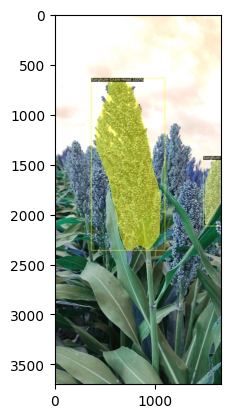

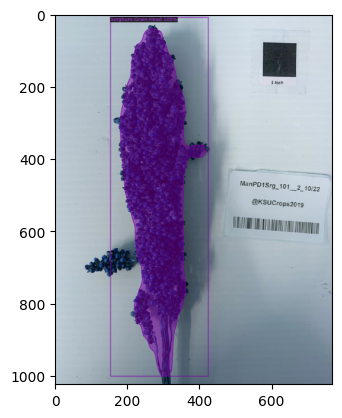

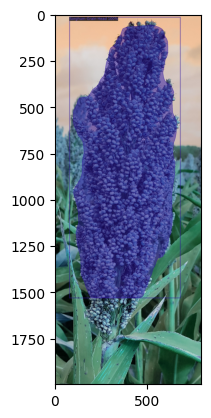

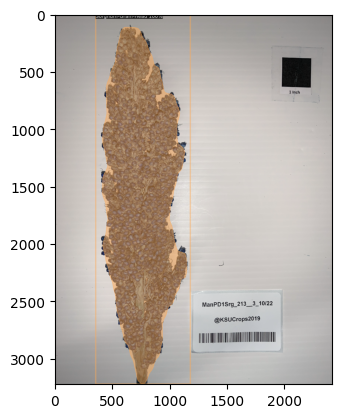

CPU times: user 3.7 s, sys: 746 ms, total: 4.45 s
Wall time: 3.75 s


In [19]:
%%time
from detectron2.utils.visualizer import ColorMode
import glob
import matplotlib.pyplot as plt

for imageName in glob.glob('./test_images/*.jpg'):
    im = cv2.imread(imageName)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()